# INSTALL TENSORFLOW

In [0]:
# Tensorboard
! pip install tensorflow-gpu==2.0.0
# ! pip install --upgrade tf-nightly-gpu
! pip uninstall tensorflow-tensorboard
! pip install tensorboard

# To generate GIFs
!pip install -q imageio

# Load the TensorBoard notebook extension
%load_ext tensorboard

import tensorflow as tf
print(tf.__version__)
print(str(tf.test.is_gpu_available()))

     |████████████████████████████████| 380.8MB 40kB/s 
     |████████████████████████████████| 3.8MB 19.7MB/s 
     |████████████████████████████████| 450kB 42.6MB/s 
     |████████████████████████████████| 81kB 8.9MB/s 
ERROR: tensorflow 1.15.0 has requirement tensorboard<1.16.0,>=1.15.0, but you'll have tensorboard 2.0.2 which is incompatible.
ERROR: tensorflow 1.15.0 has requirement tensorflow-estimator==1.15.1, but you'll have tensorflow-estimator 2.0.1 which is incompatible.
ERROR: tensorboard 2.0.2 has requirement grpcio>=1.24.3, but you'll have grpcio 1.15.0 which is incompatible.
ERROR: google-colab 1.0.0 has requirement google-auth~=1.4.0, but you'll have google-auth 1.7.1 which is incompatible.
  Found existing installation: google-auth 1.4.2
    Uninstalling google-auth-1.4.2:
      Successfully uninstalled google-auth-1.4.2
  Found existing installation: tensorboard 1.15.0
    Uninstalling tensorboard-1.15.0:
      Successfully uninstalled tensorboard-1.15.0
  Found existi

     |████████████████████████████████| 2.4MB 5.0MB/s 
ERROR: tensorflow 1.15.0 has requirement tensorboard<1.16.0,>=1.15.0, but you'll have tensorboard 2.0.2 which is incompatible.
ERROR: tensorflow 1.15.0 has requirement tensorflow-estimator==1.15.1, but you'll have tensorflow-estimator 2.0.1 which is incompatible.
  Found existing installation: grpcio 1.15.0
    Uninstalling grpcio-1.15.0:
      Successfully uninstalled grpcio-1.15.0


2.0.0
True


In [0]:
from google.colab import drive
drive.mount('/content/drive/')
%cd /content/drive/'My Drive'/GAN/CSE676_Project2/
!ls

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/
/content/drive/My Drive/GAN/CSE676_Project2
aresize.ipynb			  data
ckpt				  discriminator.png
cycleGAN_human2carton		  generator.png
cycleGAN_human2emoji_1_0	  hy_man2woman_10_0_s_sgd_2:1
cycleGAN_man2woman_1_0		  hy_man2woman_1_0_s_sgd_4:1
cycleGAN_man2woman_10_0		  logs
cycleGAN_man2woman_10_0_batch	  result
cycleGAN_man2woman_1_0_batch_sgd  wtt_human2emoji_5_1_ss_sgd_3:1_rc
cycleGAN_man2woman_1_0_s_sgd	  wtt_man2woman_5_1_s_sgd_3:1_rc
cycleGAN_man2woman_1

In [0]:
# !kill 428
%tensorboard --logdir ./logs

Reusing TensorBoard on port 6006 (pid 428), started 8:46:09 ago. (Use '!kill 428' to kill it.)

# IMPORT

In [0]:
import os
import PIL
import time
import glob
import imageio
import datetime
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
from tensorflow import keras
from tensorflow.keras import metrics
from IPython import display
from scipy.linalg import sqrtm

print(tf.__version__)
print(str(tf.test.is_gpu_available()))
!ls


2.0.0
True
aresize.ipynb			  data
ckpt				  discriminator.png
cycleGAN_human2carton		  generator.png
cycleGAN_human2emoji_1_0	  hy_man2woman_10_0_s_sgd_2:1
cycleGAN_man2woman_1_0		  hy_man2woman_1_0_s_sgd_4:1
cycleGAN_man2woman_10_0		  logs
cycleGAN_man2woman_10_0_batch	  result
cycleGAN_man2woman_1_0_batch_sgd  wtt_human2emoji_5_1_ss_sgd_3:1_rc
cycleGAN_man2woman_1_0_s_sgd	  wtt_man2woman_5_1_s_sgd_3:1_rc
cycleGAN_man2woman_1_1		  wtt_man2woman_5_1_ss_sgd_3:1
cycleGAN_man2woman_1_1_sgd	  wtt_man2woman_5_1_ss_sgd_3:1_rc
cycleGAN_man2woman_1_1_s_sgd	  zxg_man2woman_1_0_s_sgd_3:1
cycleGAN_man2woman_5_1_s_sgd_3:1  zxg_man2woman_5_0_s_sgd_2:1


In [0]:
IMG_HEIGHT = 128
IMG_WIDTH = 128
DATA = './data/'
cycle_lambda = 5
identity_lambda = 1
batch_size = 64
begin = 0
drop_rate = 0.3
version = 'wtt_mf_5_1_s_sgd_3:1_rc'
JJ = 10

# DATA

In [0]:
def preprocess(img_path):
    img = tf.image.decode_jpeg(tf.io.read_file(img_path))
    img = tf.cast(img, tf.float32)
    img = (img / 127.5) - 1
    if tf.random.uniform(()) > 0.5:
        img = tf.image.flip_left_right(img)
    if tf.random.uniform(()) > 0.5:
        img = tf.image.resize(img, [150, 150], 'nearest')
        img = tf.image.random_crop(img, [128, 128, 3])    
    return img
def preprocess1(img_path):
    img = tf.image.decode_jpeg(tf.io.read_file(img_path))
    img = tf.cast(img, tf.float32)
    img = (img / 127.5) - 1
    return img

In [0]:
listM = tf.data.Dataset.list_files(DATA + 'scaled_male' +'/*.jpg', shuffle=False)      

In [0]:
listF = tf.data.Dataset.list_files(DATA + 'scaled_female' +'/*.jpg', shuffle=False)    

In [0]:
train_m = listM.shuffle(20000).repeat().map(preprocess).batch(batch_size, drop_remainder=True)
train_m_it = iter(train_m)
train_f = listF.shuffle(20000).repeat().map(preprocess).batch(batch_size, drop_remainder=True)
train_f_it = iter(train_f)

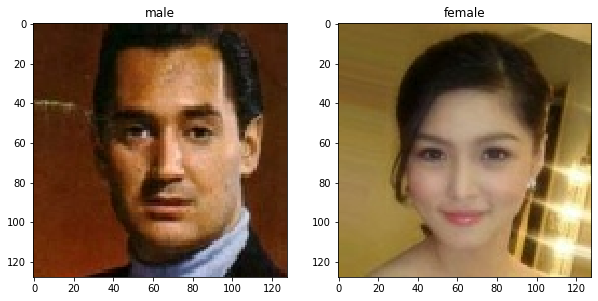

In [0]:
male = next(train_m_it)
female = next(train_f_it)

plt.figure(figsize=(10, 5))
plt.subplot(121)
plt.title('male')
plt.imshow(male[0] * 0.5 + 0.5)
plt.subplot(122)
plt.title('female')
plt.imshow(female[0] * 0.5 + 0.5)

In [0]:
# sample man/woman image, used for creating GIF recording the process of training
sampleM = tf.data.Dataset.list_files(DATA + 'sampled_man' +'/*.jpg', shuffle=False)
sampleF = tf.data.Dataset.list_files(DATA + 'sampled_woman' +'/*.jpg', shuffle=False)
sample_m = sampleM.map(preprocess1).cache().batch(10, drop_remainder=True)
sample_man = next(iter(sample_m))
sample_f = sampleF.map(preprocess1).cache().batch(10, drop_remainder=True)
sample_woman = next(iter(sample_f))

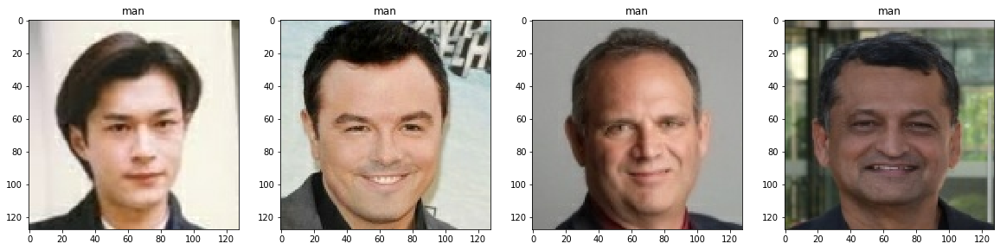

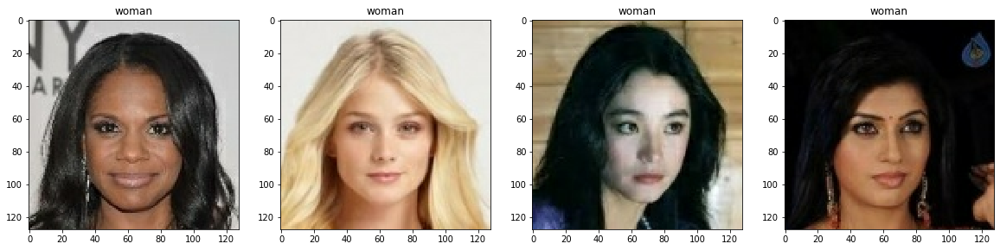

In [0]:
plt.figure(figsize=(20, 5))
plt.subplot(141)
plt.title('man')
plt.imshow(sample_man[0] * 0.5 + 0.5)
plt.subplot(142)
plt.title('man')
plt.imshow(sample_man[1] * 0.5 + 0.5)
plt.subplot(143)
plt.title('man')
plt.imshow(sample_man[2] * 0.5 + 0.5)
plt.subplot(144)
plt.title('man')
plt.imshow(sample_man[3] * 0.5 + 0.5)

plt.figure(figsize=(20, 5))
plt.subplot(141)
plt.title('woman')
plt.imshow(sample_woman[0] * 0.5 + 0.5)
plt.subplot(142)
plt.title('woman')
plt.imshow(sample_woman[1] * 0.5 + 0.5)
plt.subplot(143)
plt.title('woman')
plt.imshow(sample_woman[2] * 0.5 + 0.5)
plt.subplot(144)
plt.title('woman')
plt.imshow(sample_woman[3] * 0.5 + 0.5)

# Generator

In [0]:
class Downsample(keras.Model):

    def __init__(self, filters, size, apply_batchnorm=True):
        super(Downsample, self).__init__()
        
        self.apply_batchnorm = apply_batchnorm
        initializer = tf.random_normal_initializer(0., 0.02)

        self.conv1 = keras.layers.Conv2D(filters,
                                            (size, size),
                                            strides=2,
                                            padding='same',
                                            kernel_initializer=initializer,
                                            use_bias=False)
        if self.apply_batchnorm:
            self.batchnorm = keras.layers.BatchNormalization()

    def call(self, x, training):
        x = self.conv1(x)
        if self.apply_batchnorm:
            x = self.batchnorm(x, training=training)
        x = tf.nn.leaky_relu(x)
        return x


class Upsample(keras.Model):

    def __init__(self, filters, size, apply_dropout=False):
        super(Upsample, self).__init__()
        
        self.apply_dropout = apply_dropout
        initializer = tf.random_normal_initializer(0., 0.02)

        self.up_conv = keras.layers.Conv2DTranspose(filters,
                                                       (size, size),
                                                       strides=2,
                                                       padding='same',
                                                       kernel_initializer=initializer,
                                                       use_bias=False)
        self.batchnorm = keras.layers.BatchNormalization()
        if self.apply_dropout:
            self.dropout = keras.layers.Dropout(drop_rate)

    def call(self, x1, x2, training=None):

        x = self.up_conv(x1)
        x = self.batchnorm(x, training=training)
        if self.apply_dropout:
            x = self.dropout(x, training=training)
        x = tf.nn.relu(x)
        x = tf.concat([x, x2], axis=-1)
        return x
      
class Generator(keras.Model):

    def __init__(self):
        super(Generator, self).__init__()

        initializer = tf.random_normal_initializer(0., 0.02)

        self.down1 = Downsample(64, 4, apply_batchnorm=False)
        self.down2 = Downsample(128, 4)
        self.down3 = Downsample(256, 4)
        self.down4 = Downsample(512, 4)
        self.down5 = Downsample(512, 4)
        self.down6 = Downsample(512, 4)
        self.down7 = Downsample(512, 4)

        self.up2 = Upsample(512, 4, apply_dropout=True)
        self.up3 = Upsample(512, 4, apply_dropout=True)
        self.up4 = Upsample(512, 4)
        self.up5 = Upsample(256, 4)
        self.up6 = Upsample(128, 4)
        self.up7 = Upsample(64, 4)

        self.last = keras.layers.Conv2DTranspose(3, (4, 4),
                                                    strides=2,
                                                    padding='same',
                                                    kernel_initializer=initializer)


    def call(self, inputs, training=None):
        # x shape == (bs, 128, 128, 3) 
        x1 = self.down1(inputs, training=training)  # (bs, 64, 64, 64)
        x2 = self.down2(x1, training=training)  # (bs, 32, 32, 128)
        x3 = self.down3(x2, training=training)  # (bs, 16, 16, 256)
        x4 = self.down4(x3, training=training)  # (bs, 8, 8, 512)
        x5 = self.down5(x4, training=training)  # (bs, 4, 4, 512)
        x6 = self.down6(x5, training=training)  # (bs, 2, 2, 512)
        x7 = self.down7(x6, training=training)  # (bs, 1, 1, 512)

        x10 = self.up2(x7, x6, training=training)  # (bs, 2, 2, 1024)
        x11 = self.up3(x10, x5, training=training)  # (bs, 4, 4, 1024)
        x12 = self.up4(x11, x4, training=training)  # (bs, 8, 8, 1024)
        x13 = self.up5(x12, x3, training=training)  # (bs, 16, 16, 512)
        x14 = self.up6(x13, x2, training=training)  # (bs, 32, 32, 256)
        x15 = self.up7(x14, x1, training=training)  # (bs, 64, 64, 128)

        x16 = self.last(x15)  # (bs, 128, 128, 3)
        x16 = tf.nn.tanh(x16)

        return x16

    def model(self):
        x = tf.keras.layers.Input(shape=[IMG_HEIGHT, IMG_HEIGHT, 3], name='input_image')
        return keras.Model(inputs=x, outputs=self.call(x))




# Discriminator

In [0]:
class DiscDownsample(keras.Model):

    def __init__(self, filters, size, apply_batchnorm=True):
        super(DiscDownsample, self).__init__()

        self.apply_batchnorm = apply_batchnorm
        initializer = tf.random_normal_initializer(0., 0.02)

        self.conv1 = keras.layers.Conv2D(filters, (size, size),
                                            strides=2,
                                            padding='same',
                                            kernel_initializer=initializer,
                                            use_bias=False)
        if self.apply_batchnorm:
            self.batchnorm = keras.layers.BatchNormalization()

    def call(self, x, training=None):

        x = self.conv1(x)
        if self.apply_batchnorm:
            x = self.batchnorm(x, training=training)
        x = tf.nn.leaky_relu(x)
        return x
      
class Discriminator(keras.Model):

    def __init__(self):
        super(Discriminator, self).__init__()

        initializer = tf.random_normal_initializer(0., 0.02)

        self.down1 = DiscDownsample(64, 4, False)
        self.down2 = DiscDownsample(128, 4)
        self.down3 = DiscDownsample(256, 4)
        self.down4 = DiscDownsample(512, 4)
        self.down5 = DiscDownsample(512, 4)
        self.flatten = keras.layers.Flatten()
        self.dense = keras.layers.Dense(1)

        

    def call(self, inputs, training=None):
        x = self.down1(inputs, training=training)  # (bs, 64, 64, 64)
        x = self.down2(x, training=training)  # (bs, 32, 32, 128)
        x = self.down3(x, training=training)  # (bs, 16, 16, 256)
        x = self.down4(x, training=training)  # (bs, 8, 8, 512)
        x = self.down5(x, training=training)  # (bs, 4, 4, 512)
        x = self.flatten(x)                   # (bs, 4 * 4 * 512)
        x = self.dense(x)  # (bs, 1)
  
        return x
    
    def model(self):
        x = tf.keras.layers.Input(shape=[IMG_HEIGHT, IMG_HEIGHT, 3], name='input_image')
        return keras.Model(inputs=x, outputs=self.call(x))

# test

In [0]:
generator1 = Generator()
generator1.build(input_shape=(batch_size, 128, 128, 3))
generator1.model().summary()

discriminator = Discriminator()
discriminator.build(input_shape=(batch_size, 128, 128, 3))
discriminator.model().summary()


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_image (InputLayer)     [(None, 128, 128, 3)]     0         
_________________________________________________________________
downsample (Downsample)      (None, 64, 64, 64)        3072      
_________________________________________________________________
downsample_1 (Downsample)    (None, 32, 32, 128)       131584    
_________________________________________________________________
downsample_2 (Downsample)    (None, 16, 16, 256)       525312    
_________________________________________________________________
downsample_3 (Downsample)    (None, 8, 8, 512)         2099200   
_________________________________________________________________
downsample_4 (Downsample)    (None, 4, 4, 512)         4196352   
_________________________________________________________________
downsample_5 (Downsample)    (None, 2, 2, 512)         419635

# Loss

In [0]:
binary_loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def generator_loss(disc_generated_output):
    gan_loss = binary_loss_obj(tf.ones_like(disc_generated_output), disc_generated_output)
    return tf.reduce_mean(gan_loss)

def discriminator_loss(real_output, gen_output):
    loss1 = binary_loss_obj(tf.ones_like(real_output), real_output)
    loss2 = binary_loss_obj(tf.zeros_like(gen_output), gen_output)
    total = tf.reduce_mean(loss1) + tf.reduce_mean(loss2)
    return total * 0.5

def cycle_loss(real_img, cycled_img):
    loss = tf.reduce_mean(tf.abs(real_img - cycled_img))
    return loss

def identity_loss(real_img, same_img):
    loss = tf.reduce_mean(tf.abs(real_img - same_img))
    return loss

# load model

In [0]:
discF = Discriminator()
genM2F = Generator()
discM = Discriminator()
genF2M = Generator()

genM2F_optimizer = tf.keras.optimizers.Adam(3e-4, beta_1=0.5)
discF_optimizer = tf.keras.optimizers.RMSprop(1e-4)
genF2M_optimizer = tf.keras.optimizers.Adam(3e-4, beta_1=0.5)
discM_optimizer = tf.keras.optimizers.RMSprop(1e-4)


# Checkpoint

In [0]:
!rm -rf ./ckpt/$version

In [0]:
!mkdir ./ckpt/$version

In [0]:
checkpoint_dir = './ckpt/' + version + '/'
ckpt = tf.train.Checkpoint( genM2F=genM2F,
                                  genF2M=genF2M,
                                  discF = discF,
                                  discM = discM,
                                  genM2F_optimizer=genM2F_optimizer,
                                  genF2M_optimizer=genF2M_optimizer,
                                  discF_optimizer=discF_optimizer,
                                  discM_optimizer=discM_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_dir, max_to_keep=1)
# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print('Latest checkpoint restored!!', ckpt_manager.latest_checkpoint)
else:
    print("new training!")

Latest checkpoint restored!! ./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-193


# TOOL

## generate image

In [0]:
def generate_images(genM2F, genF2M, male, female, path, epoch):
  fake_female = genM2F(male, training=True)
  fake_male = genF2M(female, training=True)
  cycle_male = genF2M(fake_female, training=True)
  cycle_female = genM2F(fake_male, training=True)
  for j in range(JJ):
    plt.figure(figsize=(15, 5))
    display_list = [male[j], fake_female[j], cycle_male[j]]
    title = ['male', 'fake_female', 'cycle_male']
    for i in range(3):
      plt.subplot(1, 3, i+1)
      plt.title(title[i])
      plt.imshow(display_list[i] * 0.5 + 0.5)
      plt.axis('off')
    plt.savefig(path + '{}_{:04d}.png'.format(2*j, epoch))
    plt.close()
    
    plt.figure(figsize=(15, 5))
    display_list = [female[j], fake_male[j], cycle_female[j]]
    title = ['female', 'fake_male', 'cycle_female']
    for i in range(3):
      plt.subplot(1, 3, i+1)
      plt.title(title[i])
      plt.imshow(display_list[i] * 0.5 + 0.5)
      plt.axis('off')
    plt.savefig(path + '{}_{:04d}.png'.format(2*j+1, epoch))
    plt.close()

## FID

In [0]:
# laod the FID Class
class FID_Metrics(object):

    def __init__(self):
        self.combined_vector_generated = None
        self.combined_vector_real = None
        self.InceptionV3_Model = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet', pooling='avg')
        self.fid_score = None
        self.firsttime = True


    def update_vector(self, generated_img, real_img):
        if generated_img.shape[1] != 299:
            generated_img = tf.image.resize(generated_img, size=(299,299), method="nearest")
        if real_img.shape[1] != 299:
            real_img = tf.image.resize(real_img, size=(299,299), method="nearest")

        generated_vector = self.InceptionV3_Model(generated_img)
        real_vector = self.InceptionV3_Model(real_img)

        if self.firsttime:
            self.combined_vector_generated = generated_vector
            self.combined_vector_real = real_vector
            self.firsttime = False
        else:
            self.combined_vector_generated = tf.concat([self.combined_vector_generated, generated_vector], axis = 0)
            self.combined_vector_real = tf.concat([self.combined_vector_real, real_vector], axis = 0)


    def calculate_frechet_distance(self, mu1, sigma1, mu2, sigma2):
        '''
        implementation of the Frechet Distance
        d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2))
        '''
        diff = mu1 - mu2
        ssdiff = np.sum((mu1 - mu2)**2.0)        
        covmean = sqrtm(sigma1.dot(sigma2))       

        # check covmean
        if np.iscomplexobj(covmean):            
            covmean = covmean.real
        tr_covmean = np.trace(covmean)
        
        s1 = np.trace(sigma1)
        s2 = np.trace(sigma2)
        return ssdiff +s1  + s2 - 2*tr_covmean

    def get_mu_sigma(self, batch_inception_vector): # [b, 2048]        
        mu = np.mean(batch_inception_vector, axis = 0)
        sigma = np.cov(batch_inception_vector, rowvar=False)        
        return mu, sigma   

    def get_FID(self):
        mu1, sigma1 = self.get_mu_sigma(self.combined_vector_generated)
        mu2, sigma2 = self.get_mu_sigma(self.combined_vector_real)
        self.fid_score = self.calculate_frechet_distance(mu1, sigma1, mu2, sigma2)
        return self.fid_score


    def reset(self):
        self.combined_vector_generated = None
        self.combined_vector_real = None
        self.fid_score = None
        self.firsttime = True

# LOGS

In [0]:
 !rm -rf ./logs/$version

In [0]:
log_dir = './logs/' + version
train_summary_writer = tf.summary.create_file_writer(log_dir)

# Train step

In [0]:
@tf.function
def train_step(real_m, real_f):  
  with tf.GradientTape(persistent=True) as tape:
    fake_f = genM2F(real_m, training=True)
    cycled_m = genF2M(fake_f, training=True)

    fake_m = genF2M(real_f, training=True)
    cycled_f = genM2F(fake_m, training=True)

    same_m = genF2M(real_m, training=True)
    same_f = genM2F(real_f, training=True)

    disc_real_m = discM(real_m, training=True)
    disc_real_f = discF(real_f, training=True)

    disc_fake_m = discM(fake_m, training=True)
    disc_fake_f = discF(fake_f, training=True)

    gen_m2f_loss = generator_loss(disc_fake_f)
    gen_f2m_loss = generator_loss(disc_fake_m)
    
    total_cycle_loss = cycle_loss(real_m, cycled_m) + cycle_loss(real_f, cycled_f)
    
    it_loss_m = identity_loss(real_m, same_m)
    it_loss_f = identity_loss(real_f, same_f)
    total_gen_m2f_loss = gen_m2f_loss + cycle_lambda * total_cycle_loss + identity_lambda * it_loss_f
    total_gen_f2m_loss = gen_f2m_loss + cycle_lambda * total_cycle_loss + identity_lambda * it_loss_m

    disc_m_loss = discriminator_loss(disc_real_m, disc_fake_m)
    disc_f_loss = discriminator_loss(disc_real_f, disc_fake_f)
  
  genM2F_gradients = tape.gradient(total_gen_m2f_loss, genM2F.trainable_variables)
  genF2M_gradients = tape.gradient(total_gen_f2m_loss, genF2M.trainable_variables)
  
  discM_gradients = tape.gradient(disc_m_loss, discM.trainable_variables)
  discF_gradients = tape.gradient(disc_f_loss, discF.trainable_variables)

  genM2F_optimizer.apply_gradients(zip(genM2F_gradients, genM2F.trainable_variables))
  genF2M_optimizer.apply_gradients(zip(genF2M_gradients, genF2M.trainable_variables))
  
  discM_optimizer.apply_gradients(zip(discM_gradients, discM.trainable_variables))
  discF_optimizer.apply_gradients(zip(discF_gradients, discF.trainable_variables))
  
  return gen_m2f_loss, gen_f2m_loss, disc_m_loss, disc_f_loss, total_cycle_loss, it_loss_m, it_loss_f 

# Train

In [0]:
!rm -rf ./result/$version
!mkdir ./result/$version
!rm -rf ./result/$version/train
!mkdir ./result/$version/train
!rm -rf ./result/$version/test
!mkdir ./result/$version/test

In [0]:
fid_metrics = FID_Metrics()

87916544/87910968 [==============================] - 2s 0us/step


In [0]:
def train():
  print('version:',version,', batch_size:', batch_size, ', iterations:', iterations, ', begin:', begin, ', cycle_lambda:', cycle_lambda, ', identity_lambda:', identity_lambda, ', drop_rate:', drop_rate)

  print('Begin time:{}.'.format( time.strftime("%Y-%m-%d %H:%M:%S", time.localtime())))

  start_time = time.time()
  fid_metrics.reset()

  for it in range(1 + begin, iterations + 1):
    img_m = next(train_m_it)
    img_f = next(train_f_it)
    l1, l2, l3, l4, l5, l6, l7 = train_step(img_m, img_f)
    fake_f = genM2F(img_m, training=True)
    fake_m = genF2M(img_f, training=True)
    fid_metrics.update_vector(fake_m, img_m)
    fid_metrics.update_vector(fake_f, img_f)
    if it == 1 or it % 1000 == 0:
        generate_images(genM2F, genF2M, img_m, img_f, './result/' + version + '/train/', int(it/1000))
        generate_images(genM2F, genF2M, sample_man, sample_woman, './result/' + version + '/test/', int(it/1000))
    if it % 50 == 0:
        fid_score = fid_metrics.get_FID()
        fid_metrics.reset()
        if it % 200 == 0:
            ckpt_path = ckpt_manager.save()
            print('Iteration: {}, Current time:{},Save ckpt at:{}, l1:{:.2f}, l2:{:.2f}, l3:{:.2f}, l4:{:.2f}, l5:{:.2f}, l6:{:.2f}, l7:{:.2f}, fid:{:.2f}'.format(it, time.strftime("%Y-%m-%d %H:%M:%S", time.localtime()),ckpt_path, float(l1), float(l2), float(l3), float(l4), float(l5), float(l6), float(l7), fid_score))
        with train_summary_writer.as_default():
            tf.summary.scalar('generator_m2f loss',  float(l1), step=it)
            tf.summary.scalar('generator_f2m loss',  float(l2), step=it)
            tf.summary.scalar('discriminator_m loss',  float(l3), step=it)
            tf.summary.scalar('discriminator_f loss',  float(l4), step=it)
            tf.summary.scalar('cycle loss',  float(l5), step=it)
            tf.summary.scalar('identity_m loss',  float(l6), step=it)
            tf.summary.scalar('identity_f loss',  float(l7), step=it)
            tf.summary.scalar('fid',  fid_score, step=it)
  ckpt_path = ckpt_manager.save()
  end_time = time.time()
  total_sec = end_time - start_time
  hours = int((total_sec)/(60*60))
  minitues = int((total_sec/60 - hours*60))
  seconds = int(total_sec - hours*3600 - minitues*60)
  print('End time:{}, total use time:{}hours, {}minitues, {}seconds, final ckpt at:{}.'.format(time.strftime("%Y-%m-%d %H:%M:%S", time.localtime()), hours, minitues, seconds, ckpt_path))


# MAIN

In [0]:
# !kill 419
%tensorboard --logdir ./logs

In [0]:
if __name__ == '__main__':
  begin = 0
  iterations = 20000
  if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print('Latest checkpoint restored!!')
  else:
    print("new training!")
  print('\n-------------------------------------------TRAIN-------------------------------------------\n')
  train()

new training!

-------------------------------------------TRAIN-------------------------------------------

version: wtt_mf_5_1_s_sgd_3:1_rc , batch_size: 64 , iterations: 20000 , begin: 0 , cycle_lambda: 5 , identity_lambda: 1 , drop_rate: 0.3
Begin time:2019-11-26 13:17:44.
Iteration: 200, Current time:2019-11-26 14:20:27,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-1, l1:0.39, l2:1.25, l3:0.82, l4:0.88, l5:0.24, l6:0.14, l7:0.14, fid:144.92
Iteration: 400, Current time:2019-11-26 14:27:03,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-2, l1:1.06, l2:0.81, l3:0.64, l4:0.72, l5:0.20, l6:0.12, l7:0.13, fid:112.53
Iteration: 600, Current time:2019-11-26 14:33:39,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-3, l1:0.91, l2:0.91, l3:0.67, l4:0.64, l5:0.19, l6:0.11, l7:0.12, fid:114.36
Iteration: 800, Current time:2019-11-26 14:40:13,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-4, l1:0.96, l2:0.94, l3:0.64, l4:0.64, l5:0.21, l6:0.12, l7:0.12, fid:108.39
Iteration: 1000, Curren

In [0]:
if __name__ == '__main__':
  begin = 18600
  iterations = 40000
  if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print('Latest checkpoint restored!!')
  else:
    print("new training!")
  print('\n-------------------------------------------TRAIN-------------------------------------------\n')
  train()

Latest checkpoint restored!!

-------------------------------------------TRAIN-------------------------------------------

version: wtt_mf_5_1_s_sgd_3:1_rc , batch_size: 64 , iterations: 40000 , begin: 18600 , cycle_lambda: 5 , identity_lambda: 1 , drop_rate: 0.3
Begin time:2019-11-27 01:24:47.
Iteration: 18800, Current time:2019-11-27 02:19:30,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-94, l1:3.35, l2:2.84, l3:0.68, l4:0.18, l5:0.21, l6:0.05, l7:0.07, fid:58.31
Iteration: 19000, Current time:2019-11-27 02:26:24,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-95, l1:3.65, l2:2.96, l3:0.24, l4:0.06, l5:0.21, l6:0.05, l7:0.07, fid:56.37
Iteration: 19200, Current time:2019-11-27 02:33:02,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-96, l1:1.87, l2:3.06, l3:0.63, l4:0.14, l5:0.20, l6:0.05, l7:0.07, fid:56.09
Iteration: 19400, Current time:2019-11-27 02:39:39,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-97, l1:0.22, l2:2.25, l3:0.41, l4:1.02, l5:0.21, l6:0.05, l7:0.07, fid:53

In [0]:
if __name__ == '__main__':
  begin = 38600
  iterations = 50000
  if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print('Latest checkpoint restored!!')
  else:
    print("new training!")
  print('\n-------------------------------------------TRAIN-------------------------------------------\n')
  train()

Latest checkpoint restored!!

-------------------------------------------TRAIN-------------------------------------------

version: wtt_mf_5_1_s_sgd_3:1_rc , batch_size: 64 , iterations: 50000 , begin: 38600 , cycle_lambda: 5 , identity_lambda: 1 , drop_rate: 0.3
Begin time:2019-11-27 13:47:11.
Iteration: 38800, Current time:2019-11-27 14:47:31,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-194, l1:4.28, l2:3.11, l3:0.41, l4:0.02, l5:0.21, l6:0.05, l7:0.06, fid:37.60
Iteration: 39000, Current time:2019-11-27 14:54:26,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-195, l1:3.33, l2:2.70, l3:0.10, l4:0.04, l5:0.22, l6:0.05, l7:0.08, fid:38.06
Iteration: 39200, Current time:2019-11-27 15:01:05,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-196, l1:7.21, l2:0.69, l3:0.50, l4:0.06, l5:0.21, l6:0.06, l7:0.06, fid:37.99
Iteration: 39400, Current time:2019-11-27 15:07:42,Save ckpt at:./ckpt/wtt_mf_5_1_s_sgd_3:1_rc/ckpt-197, l1:6.73, l2:3.35, l3:0.07, l4:0.08, l5:0.21, l6:0.05, l7:0.07, fi

NameError: ignored

In [0]:
def make_gif():
  path = './result/' + version + '/test'
  for j in range(JJ):
    anim_file = version + '_test_{}.gif'.format(j)
    print(j)
    with imageio.get_writer(anim_file, mode='I') as writer:
      filenames = glob.glob(path +'/{}_*.png'.format(j))
      filenames = sorted(filenames)
      last = -1
      for i,filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
          last = frame
        else:
          continue
        image = imageio.imread(filename)
        writer.append_data(image)

In [0]:
make_gif()

0
1
2
3
4
5
6
7
8
9
